In [8]:
import librosa
import os
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
import re
from itertools import product
import IPython.display as ipd
from pathlib import Path
import zipfile

Normalises each .wav file in the folder to the range [-1:1] and saves to 'normalised' folder (created if doesn't exist). 

Plots the waveform of each file.

Zips the files.

In [9]:
project_dir = Path.cwd().parent

data_path = project_dir / 'data' / 'trimmed' / 'raw'
norm_path = project_dir / 'data' / 'trimmed' / 'peak_normalised'

In [10]:
os.makedirs(norm_path, exist_ok=True)

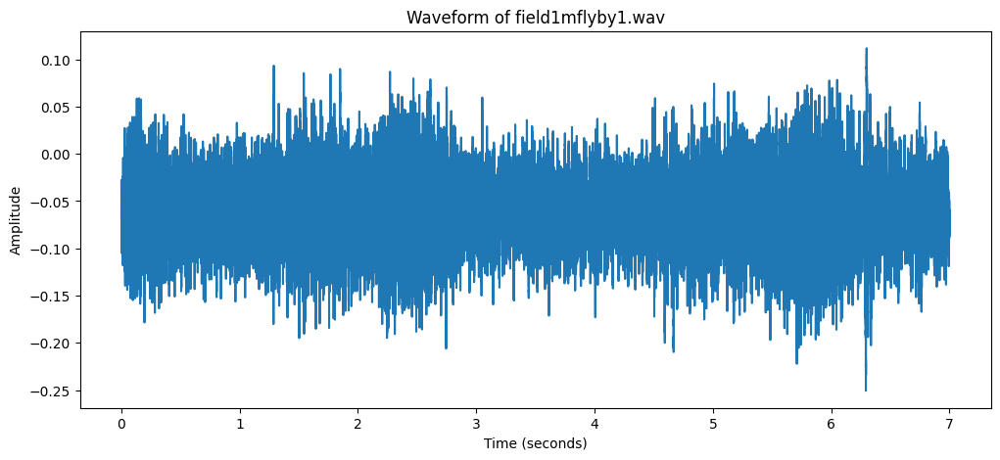

Original sound max Amplitude: 0.25061699748039246
Normalised sound max Amplitude: 1.0


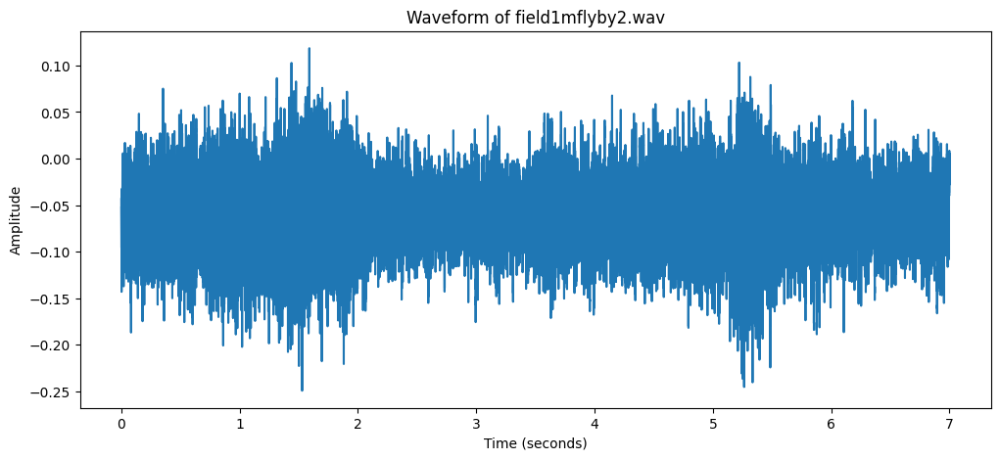

Original sound max Amplitude: 0.24956505000591278
Normalised sound max Amplitude: 1.0


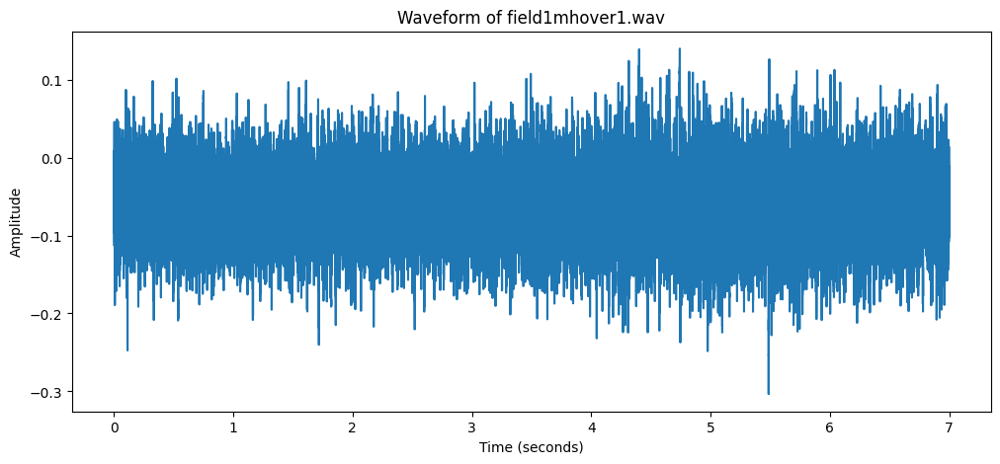

Original sound max Amplitude: 0.3035180866718292
Normalised sound max Amplitude: 1.0


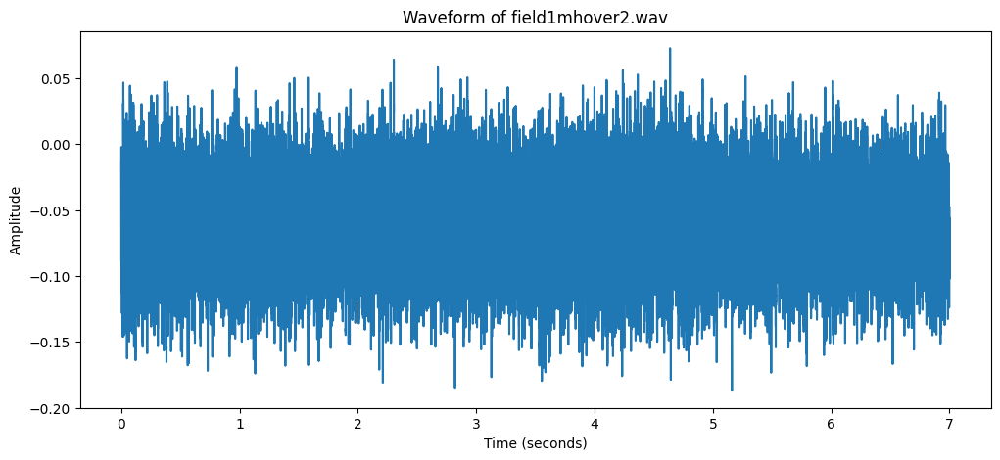

Original sound max Amplitude: 0.1870919167995453
Normalised sound max Amplitude: 1.0


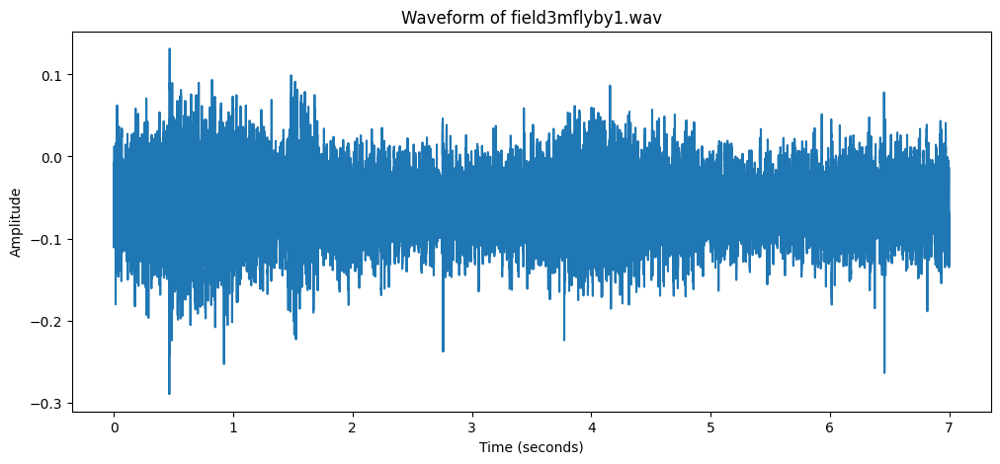

Original sound max Amplitude: 0.29000160098075867
Normalised sound max Amplitude: 1.0


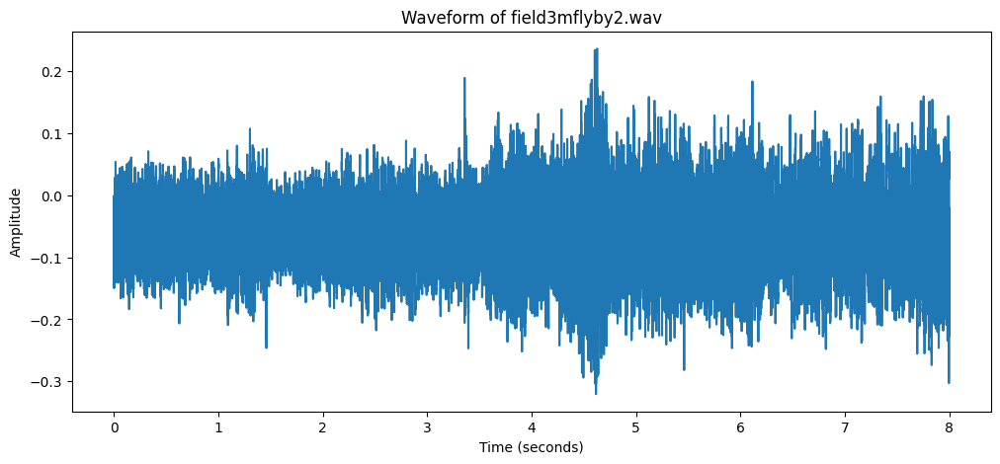

Original sound max Amplitude: 0.3206217586994171
Normalised sound max Amplitude: 1.0


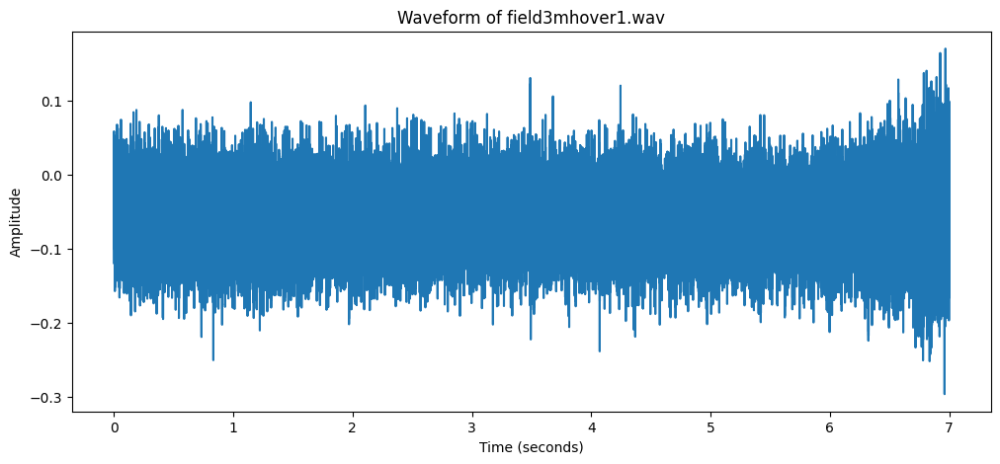

Original sound max Amplitude: 0.296886146068573
Normalised sound max Amplitude: 1.0


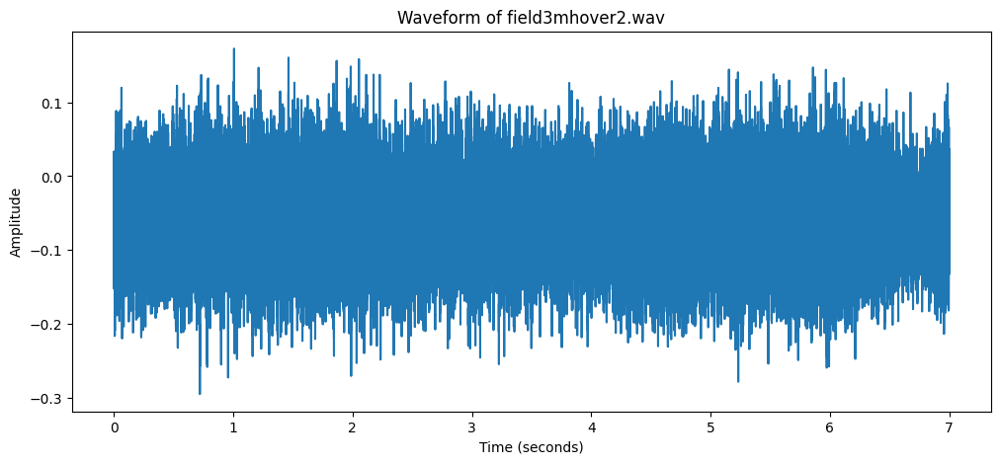

Original sound max Amplitude: 0.29482364654541016
Normalised sound max Amplitude: 1.0


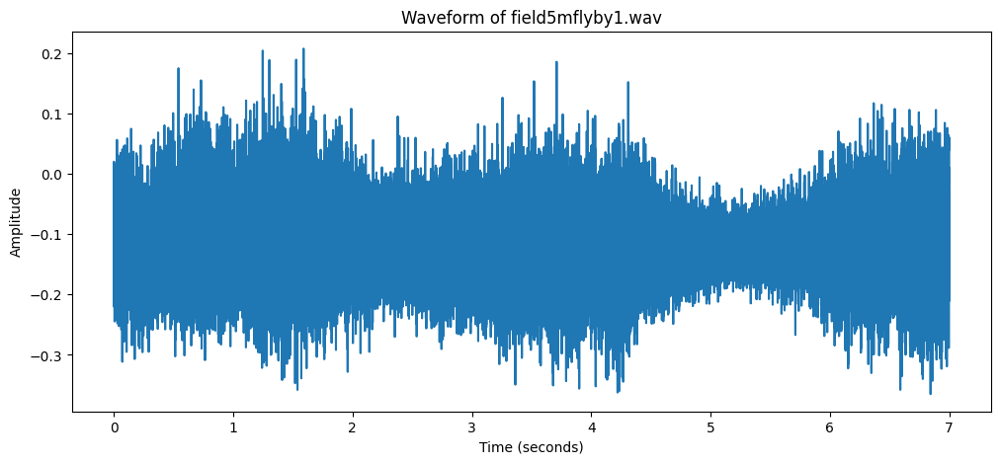

Original sound max Amplitude: 0.3649362027645111
Normalised sound max Amplitude: 1.0


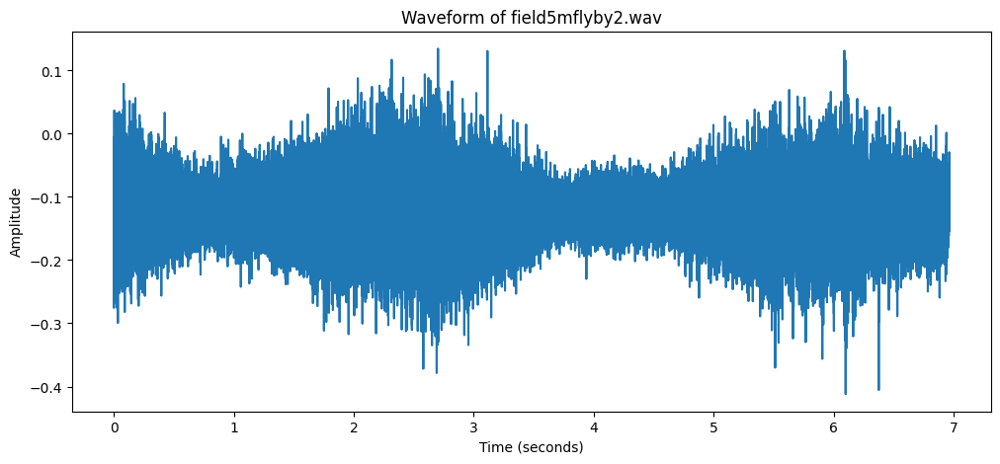

Original sound max Amplitude: 0.4120238125324249
Normalised sound max Amplitude: 1.0


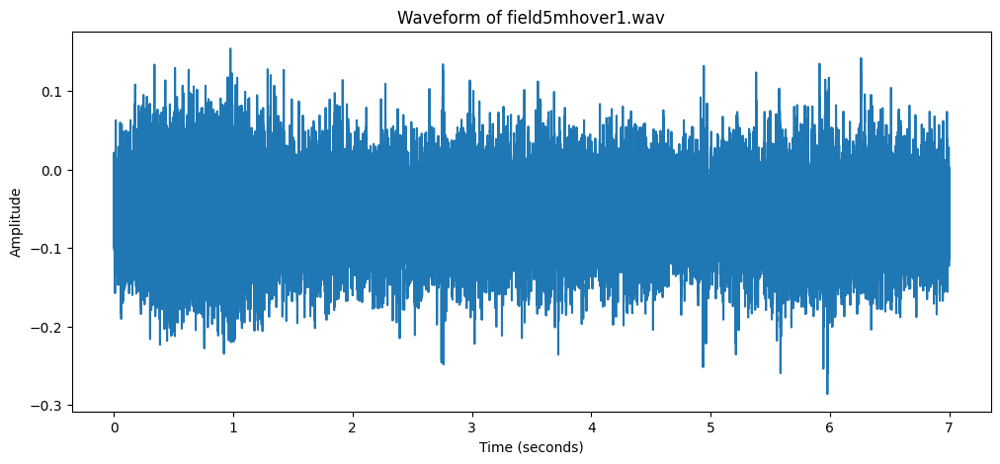

Original sound max Amplitude: 0.2860528230667114
Normalised sound max Amplitude: 1.0


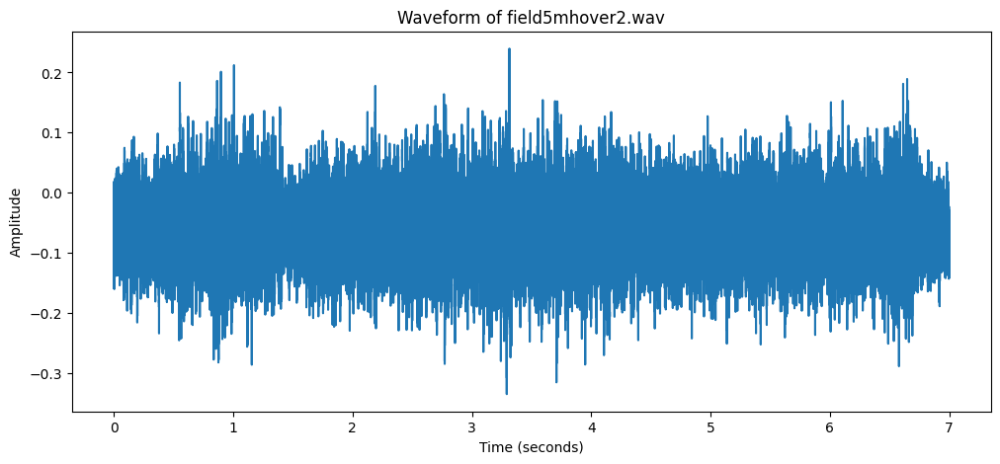

Original sound max Amplitude: 0.33452117443084717
Normalised sound max Amplitude: 1.0


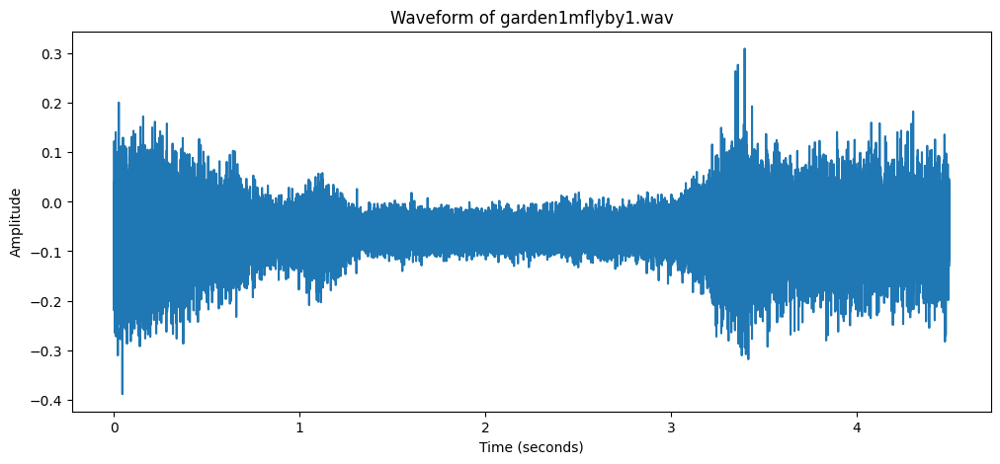

Original sound max Amplitude: 0.389199823141098
Normalised sound max Amplitude: 1.0


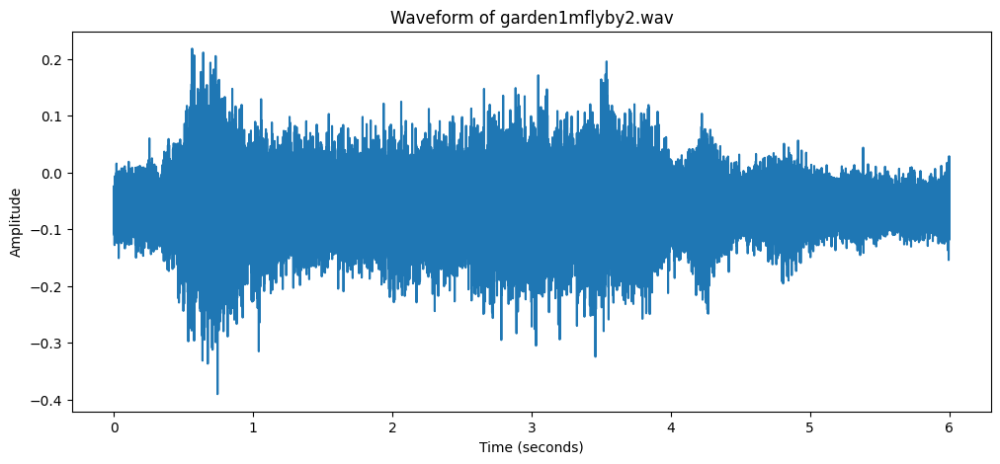

Original sound max Amplitude: 0.3907023072242737
Normalised sound max Amplitude: 1.0


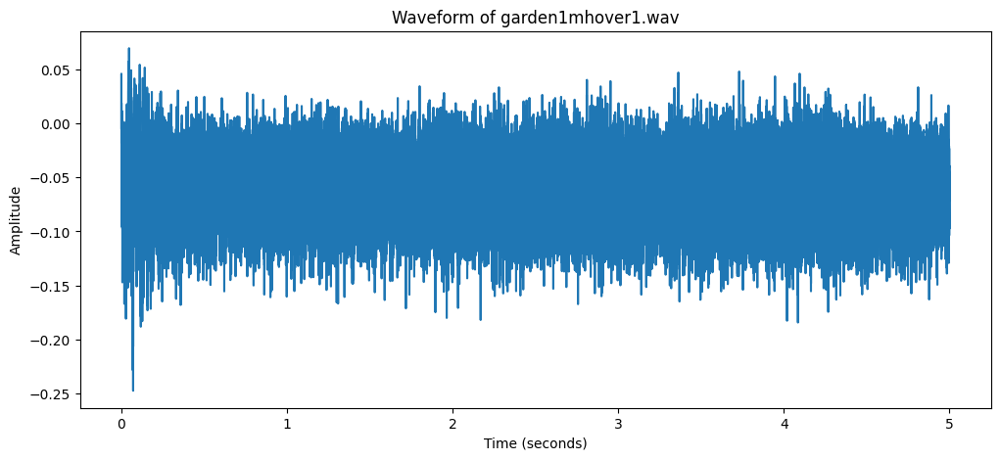

Original sound max Amplitude: 0.24774296581745148
Normalised sound max Amplitude: 1.0


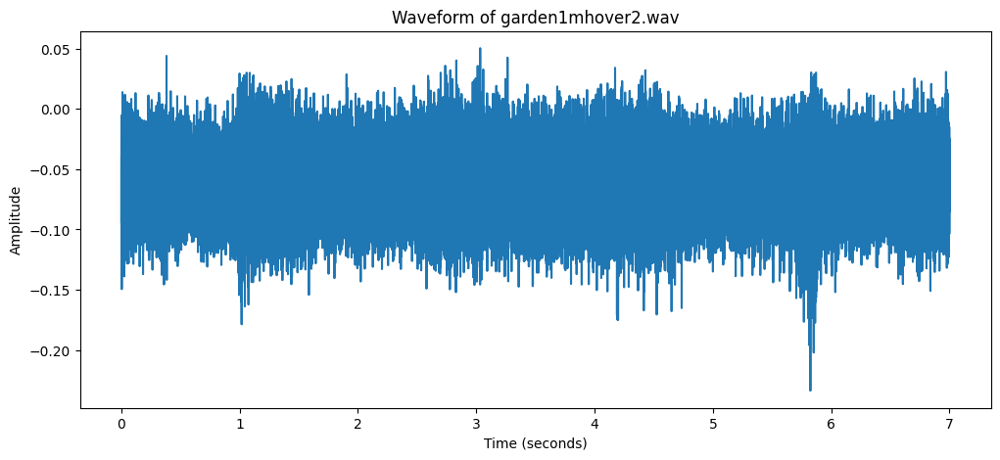

Original sound max Amplitude: 0.2336808741092682
Normalised sound max Amplitude: 1.0


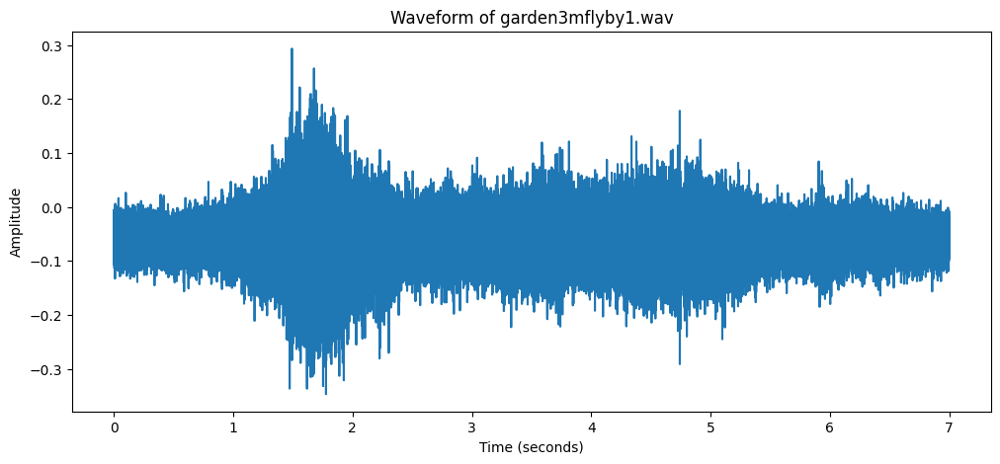

Original sound max Amplitude: 0.34681472182273865
Normalised sound max Amplitude: 1.0


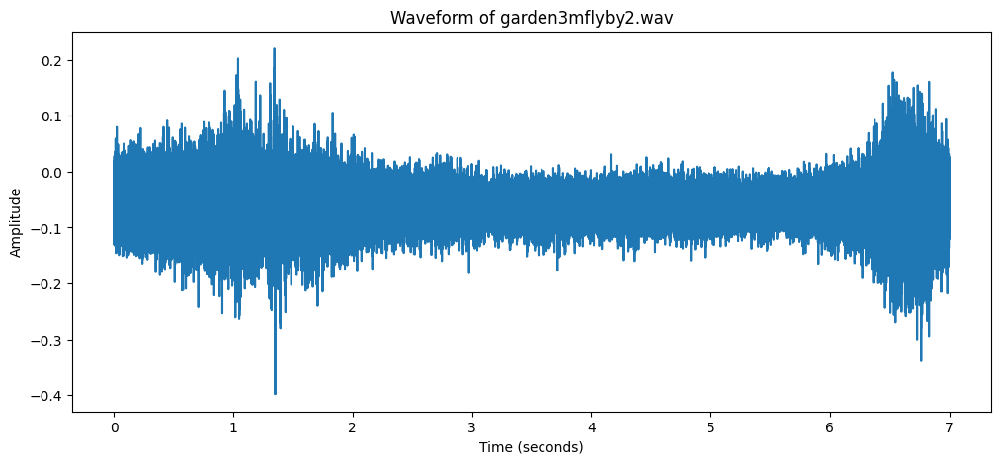

Original sound max Amplitude: 0.3980630338191986
Normalised sound max Amplitude: 1.0


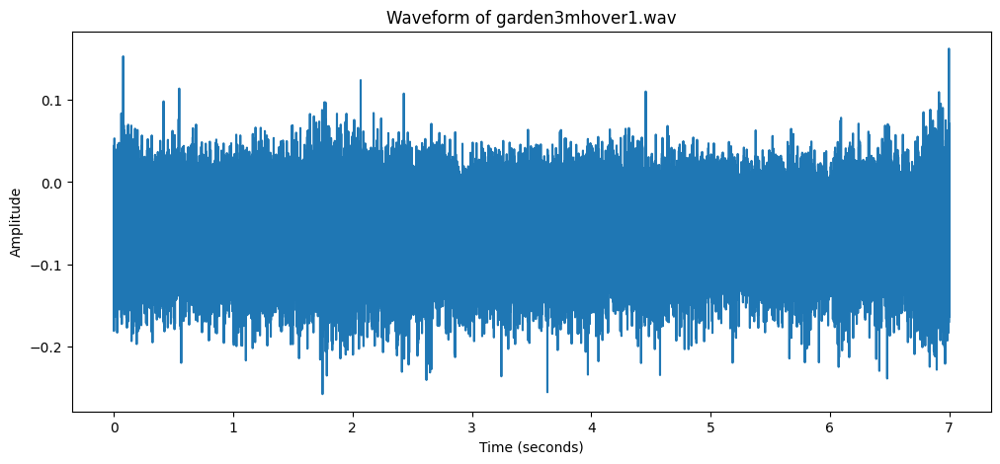

Original sound max Amplitude: 0.25833752751350403
Normalised sound max Amplitude: 1.0


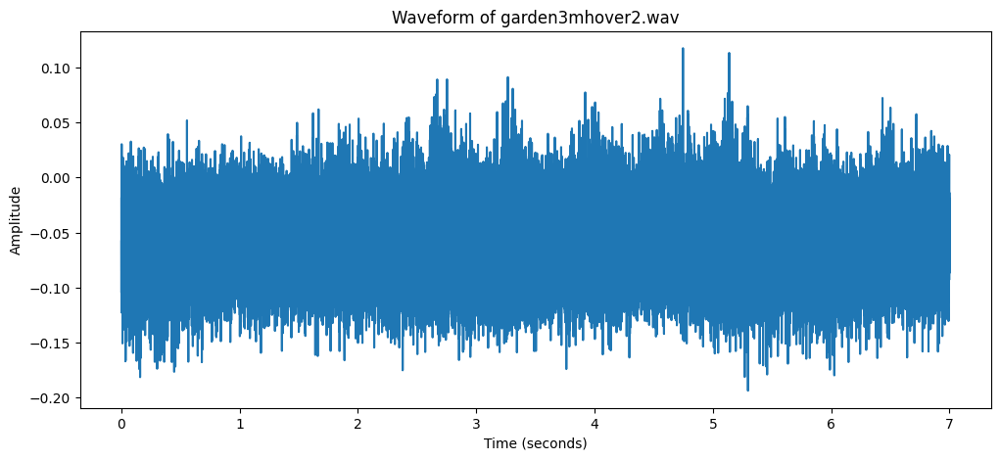

Original sound max Amplitude: 0.19379958510398865
Normalised sound max Amplitude: 1.0


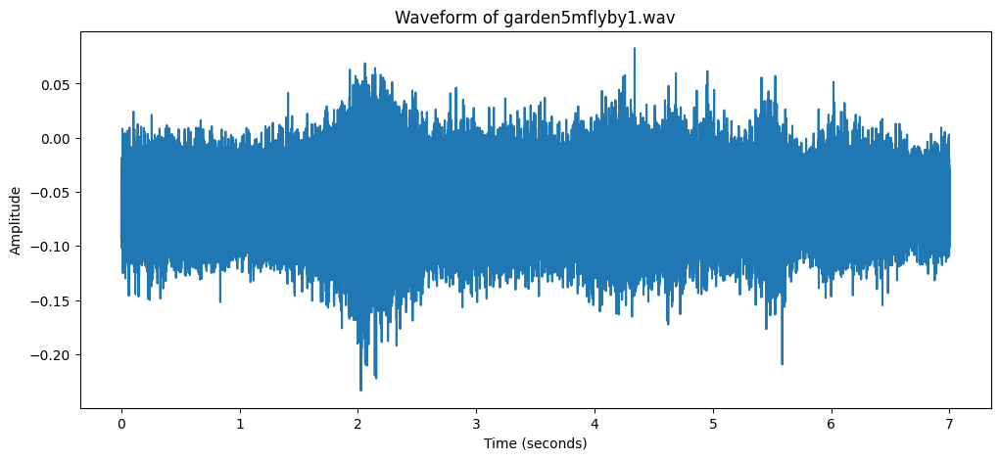

Original sound max Amplitude: 0.23363813757896423
Normalised sound max Amplitude: 1.0


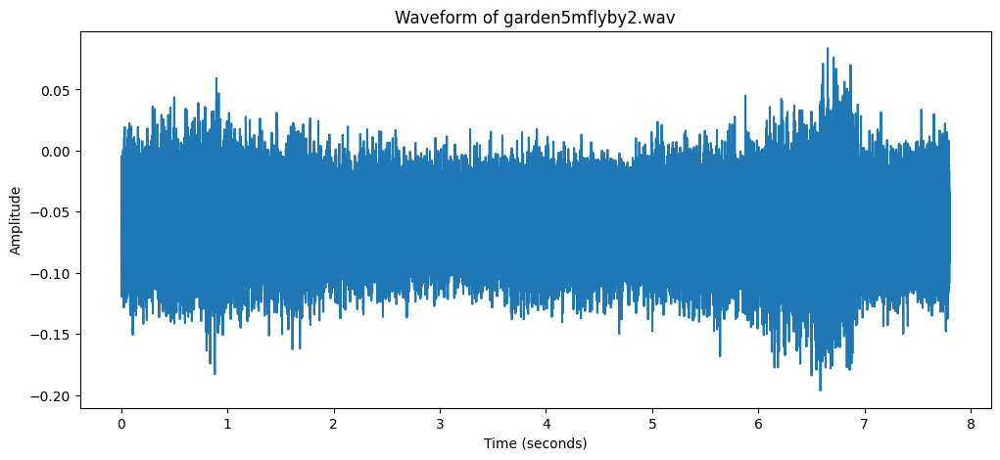

Original sound max Amplitude: 0.19649413228034973
Normalised sound max Amplitude: 1.0


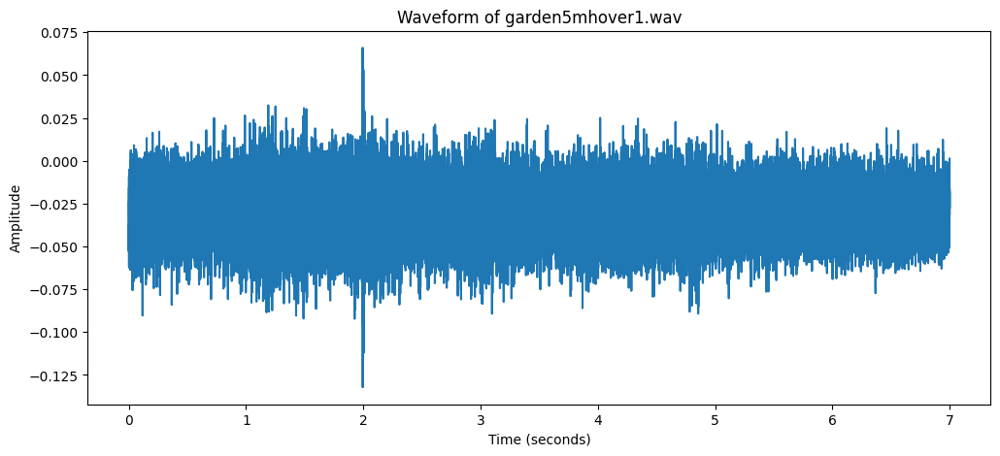

Original sound max Amplitude: 0.13221946358680725
Normalised sound max Amplitude: 1.0


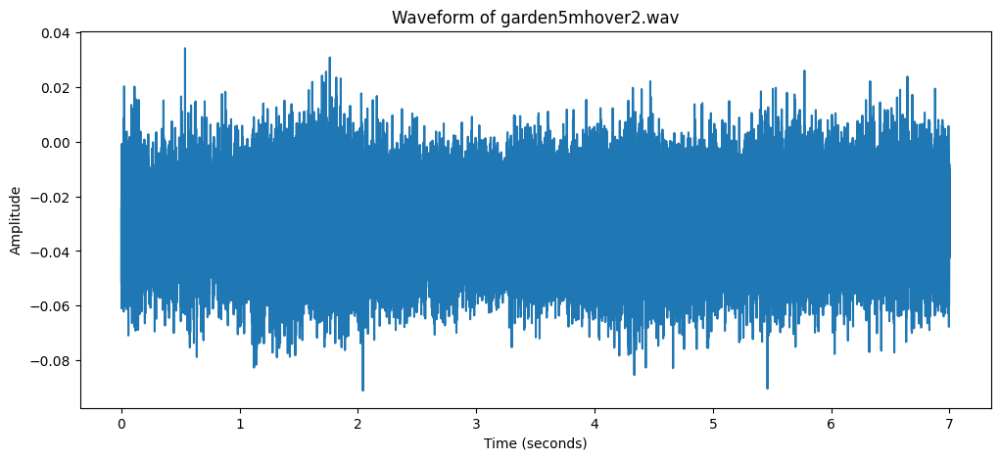

Original sound max Amplitude: 0.09116018563508987
Normalised sound max Amplitude: 1.0


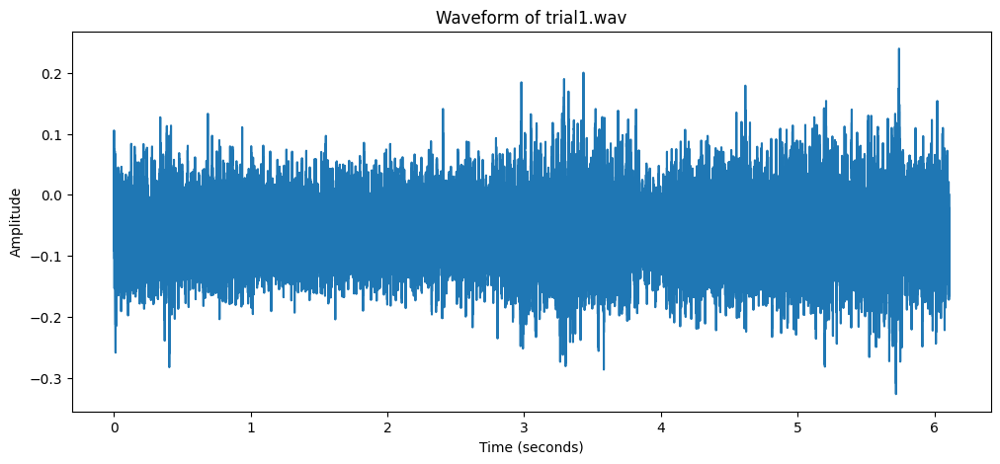

Original sound max Amplitude: 0.3267863690853119
Normalised sound max Amplitude: 1.0


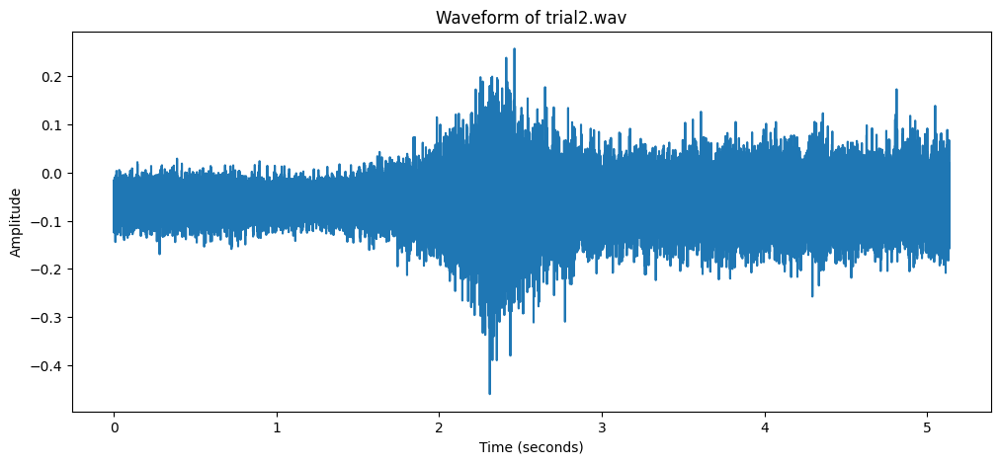

Original sound max Amplitude: 0.4601399898529053
Normalised sound max Amplitude: 1.0


In [11]:
for fname in os.listdir(data_path):
    if fname.endswith('.wav'):
        path = os.path.join(data_path, fname)
        snd, sr = librosa.load(path)
        t = np.arange(len(snd)) / sr
        
        fig, ax = plt.subplots(figsize=(12, 5))
        
        ax.plot(t, snd)
        ax.set_xlabel("Time (seconds)")
        ax.set_ylabel("Amplitude")
        ax.set_title(f"Waveform of {fname}")
        plt.show()
        
        snd_norm = snd / np.max(np.abs(snd))
        new_fname = fname.split('.')[0] + ('_norm.wav')

        print(f'Original sound max Amplitude: {np.max(np.abs(snd))}')
        print(f'Normalised sound max Amplitude: {np.max(np.abs(snd_norm))}')

        new_path = os.path.join(norm_path, new_fname)
        sf.write(new_path, snd_norm, sr)

Function to split file names and get the Environment, Height and Flight Path of each of the normalised files available.

Below is a printed dictionary of the number of files of each. Used to quickly see which files are present/missing.

In [12]:
def get_drone_flight_attrs(fname):
    s = fname.split('_')[0]
    s = s[:-1]
    m = re.search(r'(\d+m)', s)
    if m is None:
        return 'trial'
    height = m.group(1)
    env = s[:m.start()]
    flight_path = s[m.end():]

    return f'{env} {height} {flight_path}'

In [13]:
envs = ['garden', 'field']
heights = ['1m', '3m', '5m']
flight_paths = ['hover', 'flyby']

combs = list(product(envs, heights, flight_paths))
combs_dict = {}
for c in combs:
    c = ' '.join(list(c))
    combs_dict[c] = 0
combs_dict['trial'] = 0

combs_dict
for fname in os.listdir(norm_path):
    fname = get_drone_flight_attrs(fname)
    combs_dict[fname] += 1

combs_dict

{'garden 1m hover': 2,
 'garden 1m flyby': 2,
 'garden 3m hover': 2,
 'garden 3m flyby': 2,
 'garden 5m hover': 2,
 'garden 5m flyby': 2,
 'field 1m hover': 2,
 'field 1m flyby': 2,
 'field 3m hover': 2,
 'field 3m flyby': 2,
 'field 5m hover': 2,
 'field 5m flyby': 2,
 'trial': 2}

In [14]:
norm_files = [f for f in os.listdir(norm_path) if f.endswith('.wav')]
norm_files.sort() # Keep them in order

print(f"Generating widgets for {len(norm_files)} drone sounds...")

for fname in norm_files:
    print(f"File: {fname}")
    path = os.path.join(norm_path, fname)
    
    # 2. Display the audio widget
    # Note: autoplay=False is important so 26 sounds don't start at once!
    ipd.display(ipd.Audio(path, autoplay=False))
    print("-" * 30)

Generating widgets for 26 drone sounds...
File: field1mflyby1_norm.wav


------------------------------
File: field1mflyby2_norm.wav


------------------------------
File: field1mhover1_norm.wav


------------------------------
File: field1mhover2_norm.wav


------------------------------
File: field3mflyby1_norm.wav


------------------------------
File: field3mflyby2_norm.wav


------------------------------
File: field3mhover1_norm.wav


------------------------------
File: field3mhover2_norm.wav


------------------------------
File: field5mflyby1_norm.wav


------------------------------
File: field5mflyby2_norm.wav


------------------------------
File: field5mhover1_norm.wav


------------------------------
File: field5mhover2_norm.wav


------------------------------
File: garden1mflyby1_norm.wav


------------------------------
File: garden1mflyby2_norm.wav


------------------------------
File: garden1mhover1_norm.wav


------------------------------
File: garden1mhover2_norm.wav


------------------------------
File: garden3mflyby1_norm.wav


------------------------------
File: garden3mflyby2_norm.wav


------------------------------
File: garden3mhover1_norm.wav


------------------------------
File: garden3mhover2_norm.wav


------------------------------
File: garden5mflyby1_norm.wav


------------------------------
File: garden5mflyby2_norm.wav


------------------------------
File: garden5mhover1_norm.wav


------------------------------
File: garden5mhover2_norm.wav


------------------------------
File: trial1_norm.wav


------------------------------
File: trial2_norm.wav


------------------------------


In [15]:
zip_path = project_dir / 'data' / 'trimmed' / 'peak_normalised.zip'

files_zipped = []

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zf:
    for fname in os.listdir(norm_path):
        if fname.endswith('.wav'):
            fpath = norm_path / fname
            zf.write(fpath, arcname=f'peak_normalised/{fname}')
            files_zipped.append(fname)
            print(f'Zipped: {fname}')

print(f'\nDone. {len(files_zipped)} files zipped to {zip_path}')

Zipped: field1mflyby1_norm.wav
Zipped: field1mflyby2_norm.wav
Zipped: field1mhover1_norm.wav
Zipped: field1mhover2_norm.wav
Zipped: field3mflyby1_norm.wav
Zipped: field3mflyby2_norm.wav
Zipped: field3mhover1_norm.wav
Zipped: field3mhover2_norm.wav
Zipped: field5mflyby1_norm.wav
Zipped: field5mflyby2_norm.wav
Zipped: field5mhover1_norm.wav
Zipped: field5mhover2_norm.wav
Zipped: garden1mflyby1_norm.wav
Zipped: garden1mflyby2_norm.wav
Zipped: garden1mhover1_norm.wav
Zipped: garden1mhover2_norm.wav
Zipped: garden3mflyby1_norm.wav
Zipped: garden3mflyby2_norm.wav
Zipped: garden3mhover1_norm.wav
Zipped: garden3mhover2_norm.wav
Zipped: garden5mflyby1_norm.wav
Zipped: garden5mflyby2_norm.wav
Zipped: garden5mhover1_norm.wav
Zipped: garden5mhover2_norm.wav
Zipped: trial1_norm.wav
Zipped: trial2_norm.wav

Done. 26 files zipped to D:\UCD COMP SCI\PROJECT_TEST ONLY\data\trimmed\peak_normalised.zip
